In [1]:
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier
iris = load_iris()


In [2]:
X = iris.data[:,2:]
y = iris.target

tree_clf = DecisionTreeClassifier(max_depth=2)
tree_clf.fit(X,y)

DecisionTreeClassifier(max_depth=2)

C:\Users\himan\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data as

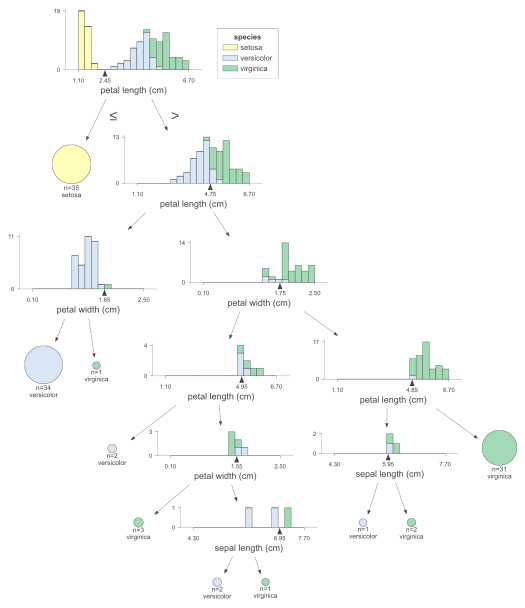

In [7]:
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from dtreeviz import model
import pandas as pd

# Load dataset
iris = load_iris()
X, y = iris.data, iris.target

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

# Convert to DataFrame/Series
X_train_df = pd.DataFrame(X_train, columns=iris.feature_names)
y_train_sr = pd.Series(y_train, name="species")

# Train classifier
clas = DecisionTreeClassifier(max_depth=None)
clas.fit(X_train_df, y_train_sr)

# Create visualization using new API
m = model(clas,
          X_train_df,
          y_train_sr,
          target_name="species",
          feature_names=iris.feature_names,
          class_names=list(iris.target_names))

# Render it (in Jupyter Notebook this will display inline)
m.view()


# Regression

In [13]:
from sklearn.datasets import fetch_california_housing
from sklearn.tree import DecisionTreeRegressor
from dtreeviz import model
import pandas as pd

# Load dataset
cal_housing = fetch_california_housing(as_frame=True)
X_train = cal_housing.data
y_train = cal_housing.target.rename("MedHouseVal")

# Train Decision Tree Regressor
regr = DecisionTreeRegressor(max_depth=2)
regr.fit(X_train, y_train)

# Visualize regression tree
viz = model(regr,
            X_train,
            y_train,
            target_name="MedHouseVal",
            feature_names=X_train.columns.tolist())

viz.view()  # opens tree in browser or inline if supported


C:\Users\himan\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names


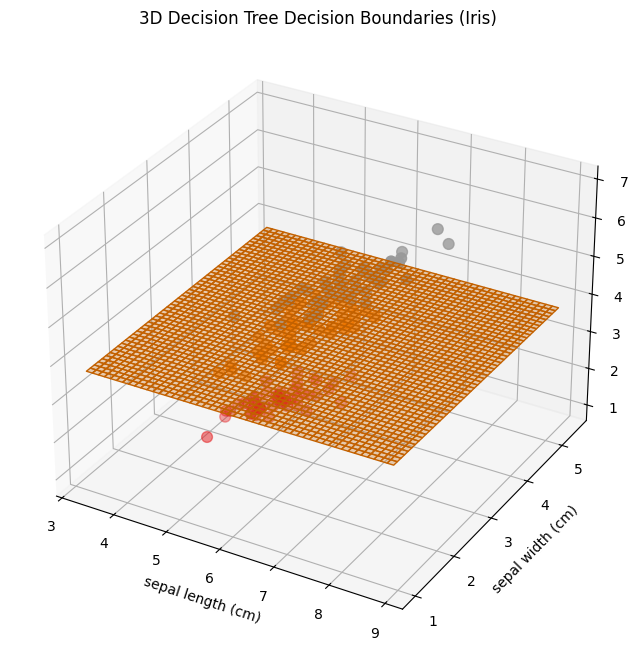

In [14]:
from sklearn.datasets import load_iris
from sklearn.tree import DecisionTreeClassifier
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Load dataset
iris = load_iris()
X = iris.data[:, :3]  # take first 3 features for 3D
y = iris.target

# Train Decision Tree
clf = DecisionTreeClassifier(max_depth=3)
clf.fit(X, y)

# 3D grid for plotting
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
z_min, z_max = X[:, 2].min() - 1, X[:, 2].max() + 1

xx, yy, zz = np.meshgrid(
    np.linspace(x_min, x_max, 50),
    np.linspace(y_min, y_max, 50),
    np.linspace(z_min, z_max, 50)
)

# Predict on the grid
grid = np.c_[xx.ravel(), yy.ravel(), zz.ravel()]
pred = clf.predict(grid).reshape(xx.shape)

# Plot 3D scatter
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X[:,0], X[:,1], X[:,2], c=y, cmap=plt.cm.Set1, s=60)

# Optional: plot decision boundary slices (for visualization)
# e.g., plot surface at z = mean of z
z_slice = np.mean(X[:, 2])
xx2d, yy2d = np.meshgrid(np.linspace(x_min, x_max, 50),
                         np.linspace(y_min, y_max, 50))
zz2d = np.full_like(xx2d, z_slice)
grid2d = np.c_[xx2d.ravel(), yy2d.ravel(), zz2d.ravel()]
pred2d = clf.predict(grid2d).reshape(xx2d.shape)
ax.plot_surface(xx2d, yy2d, zz2d, facecolors=plt.cm.Set1(pred2d / 2), alpha=0.3)

ax.set_xlabel(iris.feature_names[0])
ax.set_ylabel(iris.feature_names[1])
ax.set_zlabel(iris.feature_names[2])
plt.title("3D Decision Tree Decision Boundaries (Iris)")
plt.show()


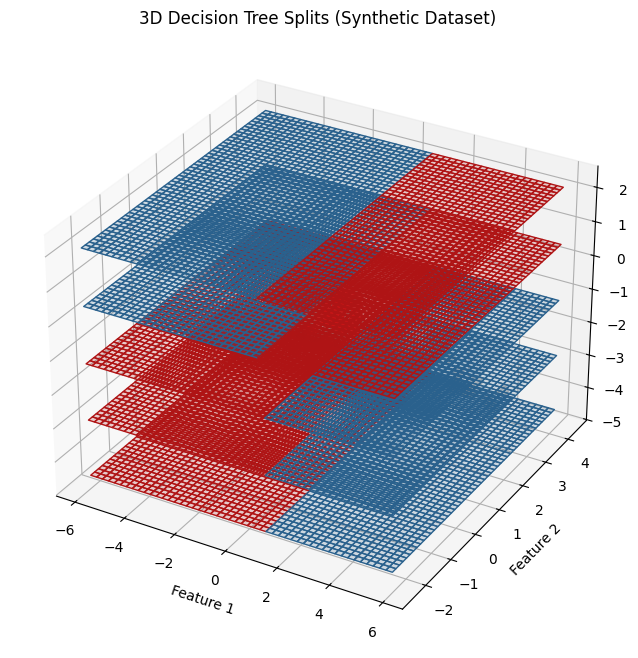

In [15]:
from sklearn.datasets import make_classification
from sklearn.tree import DecisionTreeClassifier
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create synthetic dataset with 3 informative features
X, y = make_classification(n_samples=300,
                           n_features=3,
                           n_informative=3,
                           n_redundant=0,
                           n_clusters_per_class=1,
                           n_classes=2,
                           random_state=42)

# Train Decision Tree
clf = DecisionTreeClassifier(max_depth=3)
clf.fit(X, y)

# 3D grid for plotting decision boundary
x_min, x_max = X[:,0].min() - 1, X[:,0].max() + 1
y_min, y_max = X[:,1].min() - 1, X[:,1].max() + 1
z_min, z_max = X[:,2].min() - 1, X[:,2].max() + 1

xx, yy, zz = np.meshgrid(
    np.linspace(x_min, x_max, 50),
    np.linspace(y_min, y_max, 50),
    np.linspace(z_min, z_max, 50)
)

grid = np.c_[xx.ravel(), yy.ravel(), zz.ravel()]
pred = clf.predict(grid).reshape(xx.shape)

# Plot 3D scatter
fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X[:,0], X[:,1], X[:,2], c=y, cmap=plt.cm.Set1, s=60)

# Plot decision boundary slices at different z levels
for z_slice in np.linspace(z_min, z_max, 5):
    xx2d, yy2d = np.meshgrid(np.linspace(x_min, x_max, 50),
                             np.linspace(y_min, y_max, 50))
    zz2d = np.full_like(xx2d, z_slice)
    grid2d = np.c_[xx2d.ravel(), yy2d.ravel(), zz2d.ravel()]
    pred2d = clf.predict(grid2d).reshape(xx2d.shape)
    ax.plot_surface(xx2d, yy2d, zz2d, facecolors=plt.cm.Set1(pred2d), alpha=0.2)

ax.set_xlabel("Feature 1")
ax.set_ylabel("Feature 2")
ax.set_zlabel("Feature 3")
plt.title("3D Decision Tree Splits (Synthetic Dataset)")
plt.show()
